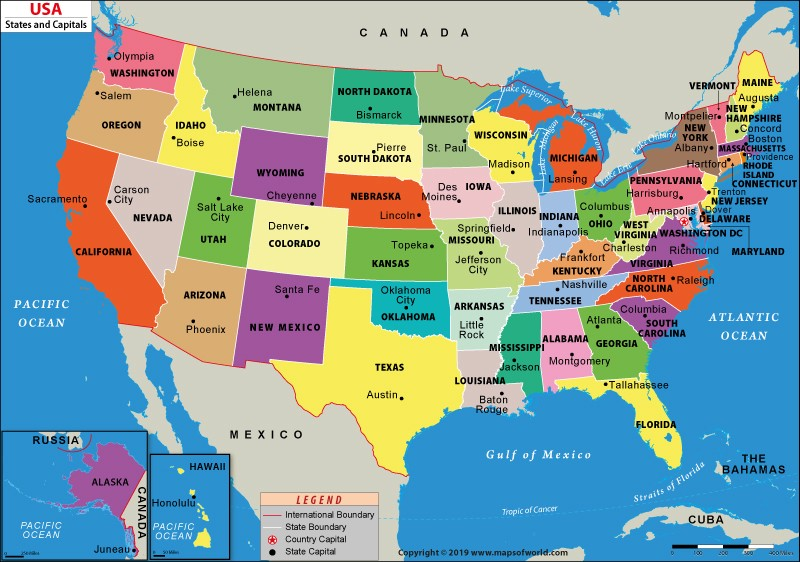

In [1]:
import pandas as pd

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
plt.style.use('ggplot')
%config InlineBackend.figure_format = 'retina'
%matplotlib inline
from datetime import datetime
import plotly.graph_objects as go
from statsmodels.tsa.seasonal import seasonal_decompose

In [3]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
import seaborn as sns
sns.set_style('dark')
%matplotlib inline
import matplotlib.ticker as ticker
from wordcloud import WordCloud, ImageColorGenerator
from sklearn.feature_extraction.text import TfidfVectorizer

In [4]:
import itertools
import warnings
import statsmodels.api as sm
from pylab import rcParams
import scipy.stats as ss
from matplotlib.gridspec import GridSpec

In [5]:
warnings.filterwarnings('ignore')
plt.style.use('fivethirtyeight')


# Part 1

- Uploading Border Crossing Data

The Border Crossing Data contains the following 7 columns:-

1. Port Name:- Name of the unique port where the border was crossed.
2. State:- State where the border was crossed.
3. Port Code:- Unique port code.
4. Border:- Border(US-Canada or US-Mexico)
5. Date:- Date of crossing the border.
6. Measure:- Mode of transportation and/or pedestrians.
7. Value:- Count of people/passengers crossed the US border.


The Border Crossing  data file contains whole data from January 1996 to December 2021 of the total incoming crossing counts into the US. It  contains 7 columns specifying the port and its unique code, the border, the mode of vehicle used, number of people crossing the border into the US, the date of crossing, the state in which they entered.
This dataset contains all the incidents of crossing the border into the US as provided by the Bureau of Transportation Statistics, Govt. of the US https://resources.data.gov/resources/dcat-us/ . 

In [6]:
#downloading csv .
BC = pd.read_csv(r'/Users/oc/Desktop/GA/material/Projects/Capstone Project/Part 4/Border_Crossing_Entry_Data.csv')
BC


,Port Name,State,Port Code,Border,Date,Measure,Value
0,Alcan,Alaska,3104,US-Canada Border,12/01/2021 12:00:00 AM,Personal Vehicle Passengers,822
1,Alcan,Alaska,3104,US-Canada Border,12/01/2021 12:00:00 AM,Personal Vehicles,468
2,Alcan,Alaska,3104,US-Canada Border,12/01/2021 12:00:00 AM,Truck Containers Empty,291
3,Alcan,Alaska,3104,US-Canada Border,12/01/2021 12:00:00 AM,Truck Containers Loaded,89
4,Alcan,Alaska,3104,US-Canada Border,12/01/2021 12:00:00 AM,Trucks,381
...,...,...,...,...,...,...,...
370866,Whitlash,Montana,3321,US-Canada Border,01/01/1996 12:00:00 AM,Bus Passengers,0
370867,Whitlash,Montana,3321,US-Canada Border,01/01/1996 12:00:00 AM,Personal Vehicles,63
370868,Whitlash,Montana,3321,US-Canada Border,01/01/1996 12:00:00 AM,Truck Containers Empty,0
370869,Whitlash,Montana,3321,US-Canada Border,01/01/1996 12:00:00 AM,Pedestrians,0


In [7]:
#checking out how many rows&columns 
(rows,column) = BC.shape
rows,column

(370871, 7)

In [8]:
BC.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 370871 entries, 0 to 370870
Data columns (total 7 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   Port Name  370871 non-null  object
 1   State      370871 non-null  object
 2   Port Code  370871 non-null  int64 
 3   Border     370871 non-null  object
 4   Date       370871 non-null  object
 5   Measure    370871 non-null  object
 6   Value      370871 non-null  int64 
dtypes: int64(2), object(5)
memory usage: 19.8+ MB


In [9]:
BC.isnull().sum()

Port Name    0
State        0
Port Code    0
Border       0
Date         0
Measure      0
Value        0
dtype: int64

In [10]:
#dropped 10 duplicates. 
BC.drop_duplicates(inplace=True)

In [11]:
BC.shape[0]

370861

In [12]:
BC.describe()

,Port Code,Value
count,370861.000000,3.708610e+05
mean,2451.274008,2.825985e+04
std,1202.403424,1.501382e+05
min,101.000000,0.000000e+00
25%,2304.000000,0.000000e+00
50%,3012.000000,1.150000e+02
75%,3401.000000,2.698000e+03
max,5301.000000,4.447374e+06


# Part 2  


## EDA

#### I am interested to use this dataset to learn about the incoming value into the USA through U.S.-Canada and the U.S.-Mexico borders. It can also prove to useful to predict the daily, weekly, monthly or annual traffic that’s going to accumulate on the borders so that the authorities can be aware of the number beforehand.

- Question 1.
 Would like to explore Ports, what is the difference and/or any consequence?

In [13]:
BC.groupby("Port Name").sum()["Value"].sort_values(ascending=False)

Port Name
San Ysidro               1251587372
El Paso                  1218674078
Laredo                    706374970
Hidalgo                   602566292
Buffalo Niagara Falls     565895699
                            ...    
Highgate Springs              55465
Kenneth G Ward                36556
Toledo                          607
Houston                           1
Everett                           1
Name: Value, Length: 121, dtype: int64

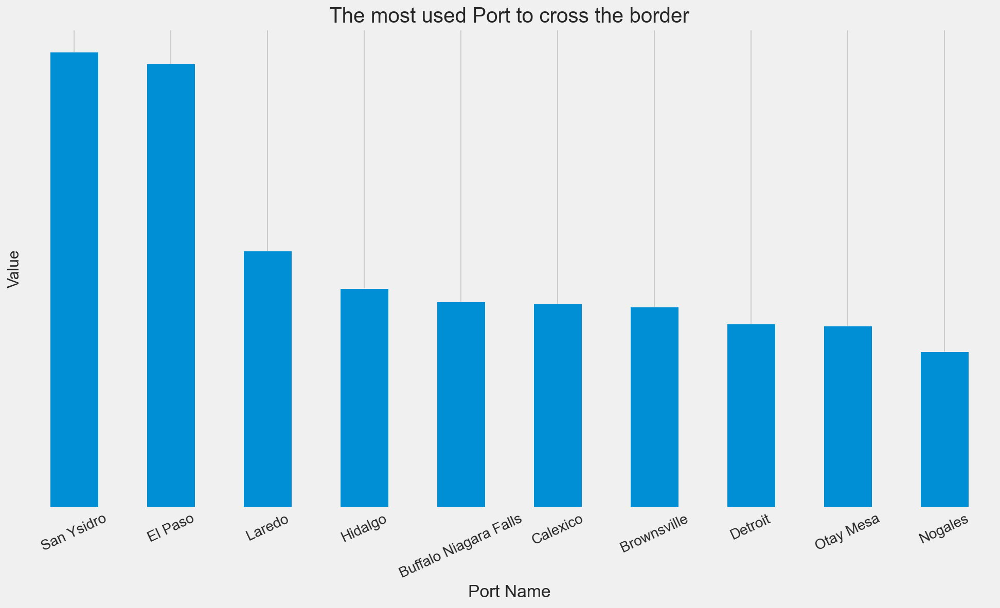

In [14]:
#displaying the highest Value for the top 10 Port Names. 
fig,x = plt.subplots()
BC.groupby("Port Name").sum()["Value"].sort_values(ascending=False)[:10].plot(kind = 'bar',figsize=(15,8))
plt.ylabel('Value', fontsize=15)
plt.xticks(rotation=25)
plt.bar('Port Name', 'Value', width=0.7, bottom=50, align='edge')
plt.title("The most used Port to cross the border")
plt.show();

El Passo and San Ysidro are two most used Ports.

In [15]:
#pip install wordcloud

# NLP

NLP based on Machine Learning can be used to establish communication channels between humans and machines.
Using Word Cloud is a data visualization technique used for representing text data in which the size of each word indicates its frequency or importance. Significant textual data points can be highlighted using a word cloud.
El Paso is most crossed border by people(Value), East Port is the most frequently crossed Port. 

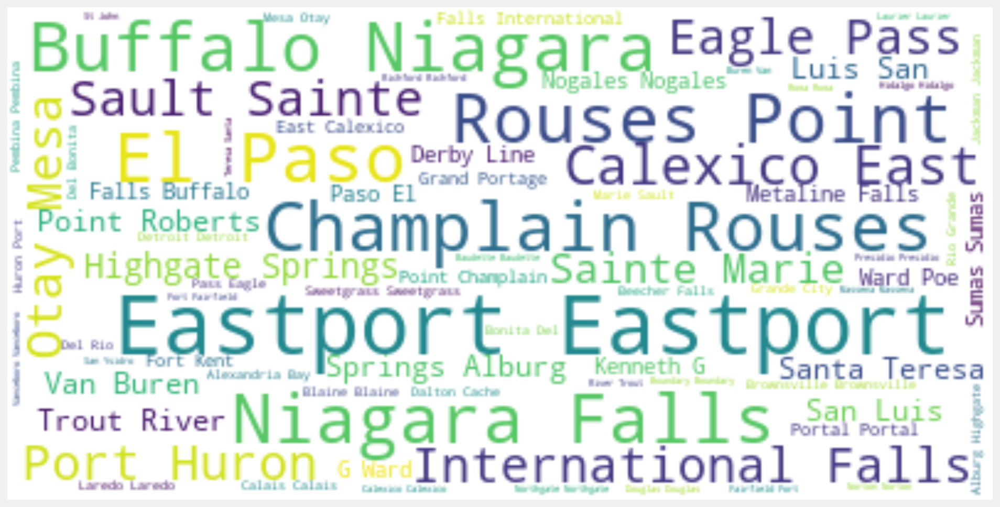

In [16]:
#NLP/ Displaying the most frequently crossed border names in the entire dataset.
text = " ".join(str(each) for each in BC['Port Name'])
# Creating and generating a word cloud image:
wordcloud = WordCloud(max_words=300, background_color="white").generate(text)
plt.figure(figsize=(15,10))
# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [17]:
tf_trigrams = TfidfVectorizer(ngram_range=(2, 2), stop_words='english')
tf_trigrams.fit(BC['Port Name'])
trigrams_tf = tf_trigrams.transform(BC['Port Name'])
trigrams_df = pd.DataFrame(trigrams_tf.todense(), columns=tf_trigrams.get_feature_names())
trigrams_df.sum().sort_values(ascending=False).head(30)

el paso                3731.000000
international falls    3706.000000
calexico east          3706.000000
eagle pass             3679.000000
port huron             3667.000000
otay mesa              3667.000000
van buren              3619.000000
trout river            3588.000000
santa teresa           3468.000000
san luis               3466.000000
point roberts          3446.000000
metaline falls         3428.000000
derby line             3428.000000
fort kent              3402.000000
grand portage          3394.000000
alexandria bay         3377.000000
dalton cache           3362.000000
del rio                3358.000000
del bonita             3323.000000
beecher falls          3312.000000
fort fairfield         3296.000000
st john                3291.000000
san ysidro             3285.000000
niagara falls          2633.265653
buffalo niagara        2633.265653
champlain rouses       2626.194585
rouses point           2626.194585
sault sainte           2588.717926
sainte marie        

- Question 2


Which is the leading neighbouring country from which a higher number of people cross the border?

Text(0.5, 1.0, 'Which state is the most border crossed by people?')

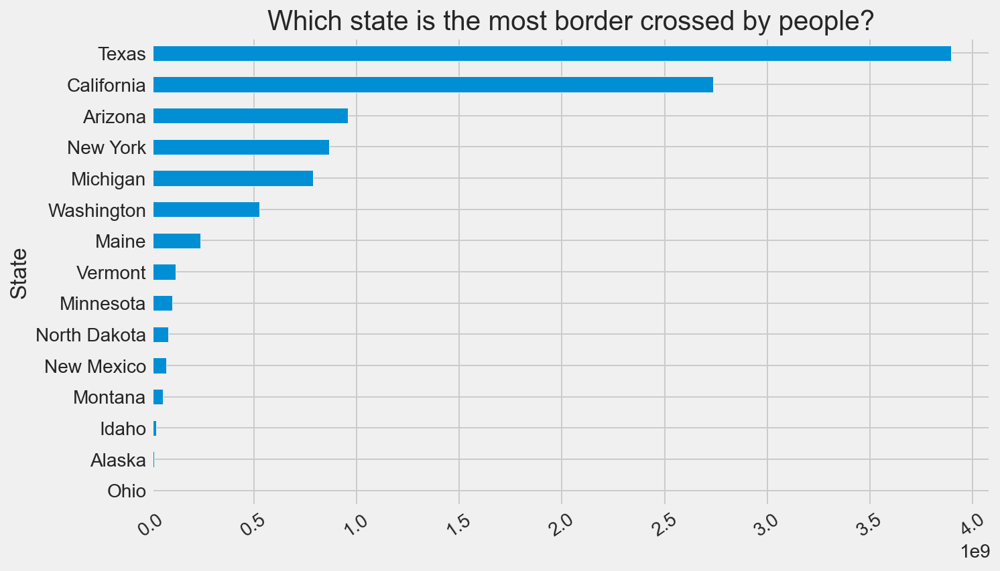

In [18]:
BC.groupby("State").sum()["Value"].sort_values().plot(kind = 'barh',figsize=(10,6));
plt.xticks(rotation=35)
plt.title("Which state is the most border crossed by people?")

Per the above plot the highest value of crossing border is through TX and CA

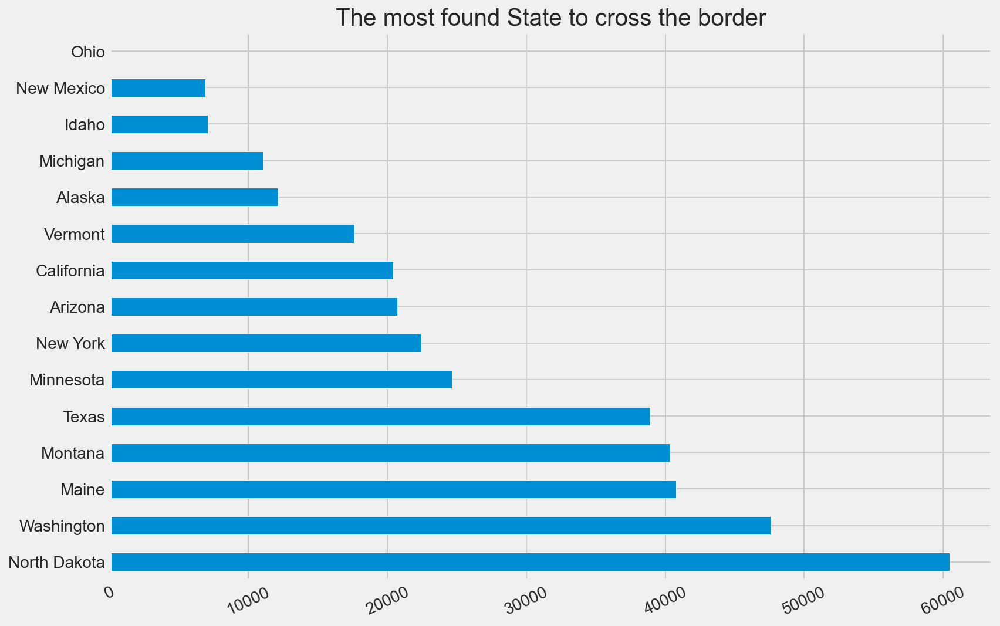

In [19]:
#state by frequency
Sfreq = BC.State.value_counts()
(Sfreq).plot(kind = 'barh',figsize=(12,8));
plt.xticks(rotation=25);
plt.title("The most found State to cross the border");

North Dakota appears to be most found State to cross the border

Text(0.5, 1.0, 'Border crossed by number of people')

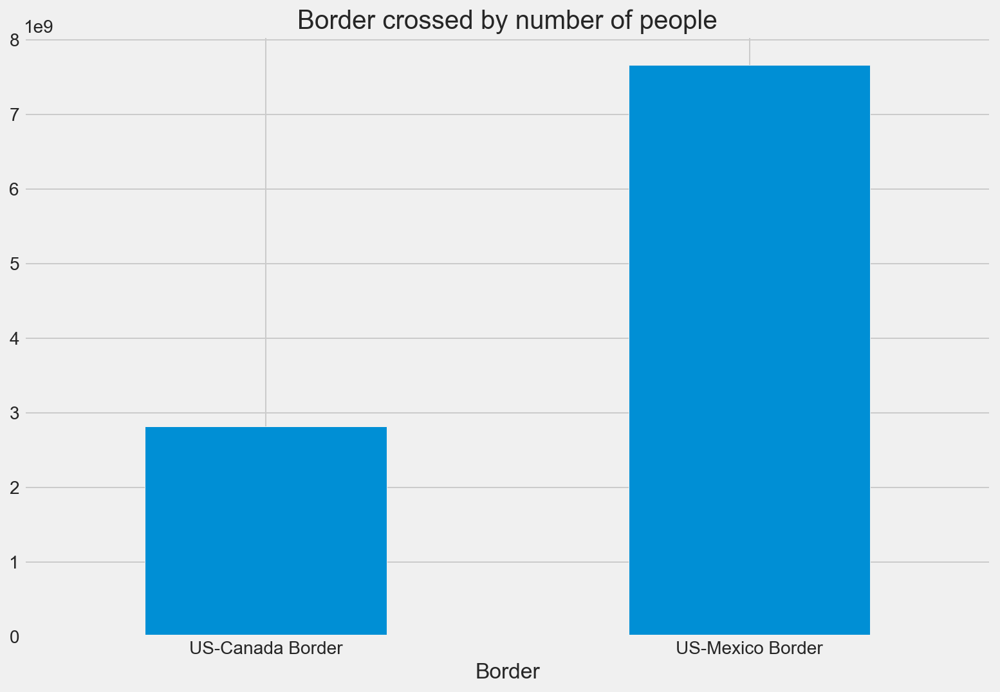

In [20]:
#I would visualize it for clear picture
BC.groupby("Border").sum()["Value"].sort_values().plot(kind = 'bar',figsize=(12,8));
plt.xticks(rotation=0)
plt.title("Border crossed by number of people")

Per plot above it is ablsolutely obvious that the US-Mexico Border has a drasticly higher value of crossing.

In [21]:
BC[['Border','Value']].groupby('Border').sum().reset_index().sort_values(by='Value', ascending=False)

,Border,Value
1,US-Mexico Border,7663097631
0,US-Canada Border,2817379880


- Question 3

What is the most commonly used Measure in order to cross the border?

#the consequence of Measure in crossing the border
mv = BC.Measure.value_counts()
mv.plot(kind = 'barh',figsize=(12,8));
plt.title("Which Measure the most occuring in crossing the border?");

In [22]:
#displaying all 12 Measures by total number of (Value) entries
BC.groupby("Measure").sum()["Value"].sort_values(ascending=False)

Measure
Personal Vehicle Passengers    5794493889
Personal Vehicles              2755221941
Pedestrians                    1135350948
Trucks                          286869762
Truck Containers Loaded         201324711
Bus Passengers                  147997983
Truck Containers Empty           73445555
Rail Containers Loaded           44461107
Rail Containers Empty            24820161
Buses                             8920804
Train Passengers                  6582144
Trains                             988506
Name: Value, dtype: int64

It is almost equally highest numbers for Personal Vehicle Passengers ( 5,794,493,889),Personal Vehicles(2,755,221,941)

Text(0.5, 1.0, 'The most used type of transportation to cross the border')

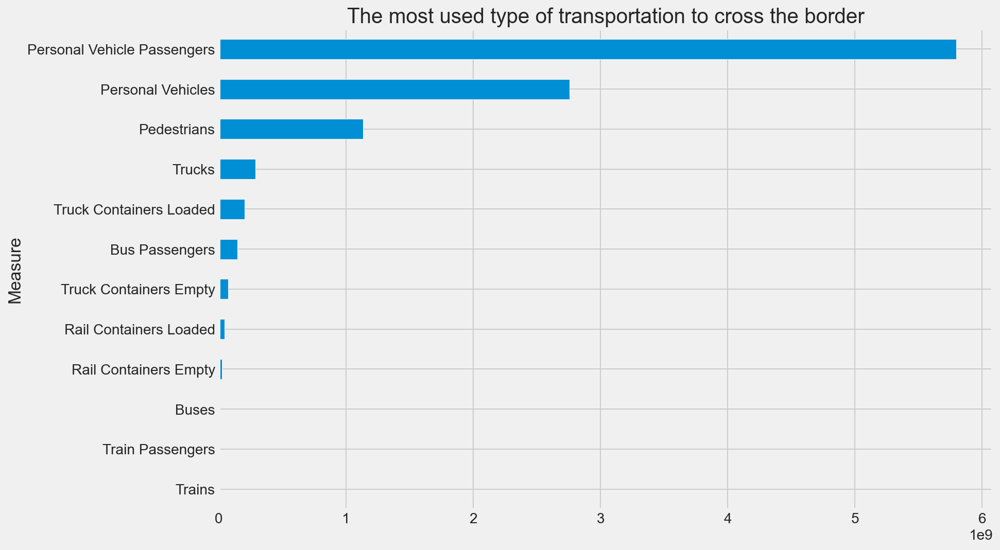

In [23]:
BC.groupby("Measure").sum()["Value"].sort_values().plot(kind = 'barh',figsize=(12,8));
plt.xticks(rotation=0)
plt.title("The most used type of transportation to cross the border")

Trains appears to be rarely crossing the border as well as Train Passengers,Buses,Rail Containers Empty.

Analysing the Border entry by Measure it becomes more interesting to visualize the data further.

In [24]:
#each measure at each country border MEX&CAN by total Value.
BC.groupby(["Measure","Border"]).sum(["Value"]).sort_values(by='Value',ascending=False)

Port Code       Value
Measure                     Border                                 
Personal Vehicle Passengers US-Mexico Border   19163986  4198297783
Personal Vehicles           US-Mexico Border   19163986  1987320131
Personal Vehicle Passengers US-Canada Border   63809550  1596196106
Pedestrians                 US-Mexico Border   19375565  1121819338
Personal Vehicles           US-Canada Border   63960401   767901810
Trucks                      US-Canada Border   62792587   157374124
                            US-Mexico Border   18371885   129495638
Truck Containers Loaded     US-Canada Border   61657890   118131725
                            US-Mexico Border   18367996    83192986
Bus Passengers              US-Canada Border   55997608    75997886
                            US-Mexico Border   17597170    72000097
Truck Containers Empty      US-Mexico Border   18307657    45081279
Rail Containers Loaded      US-Canada Border   53686121    35320198
Truck Containers Empty      US-Canada Border   62487461    28364276
Rail Containers Empty       US-Canada Border   53692145    14370761
Pedestrians                 US-Canada Border   55132680    13531610
Rail Containers Empty       US-Mexico Border   16238944    10449400
Rail Containers Loaded      US-Mexico Border   16095892     9140909
Train Passengers            US-Canada Border   53780702     6263066
Buses                       US-Mexico Border   17601994     5749108
                            US-Canada Border   56006690     3171696
Trains                      US-Canada Border   53788062      756622
Train Passengers            US-Mexico Border   15766224      319078
Trains                      US-Mexico Border   16238734      231884

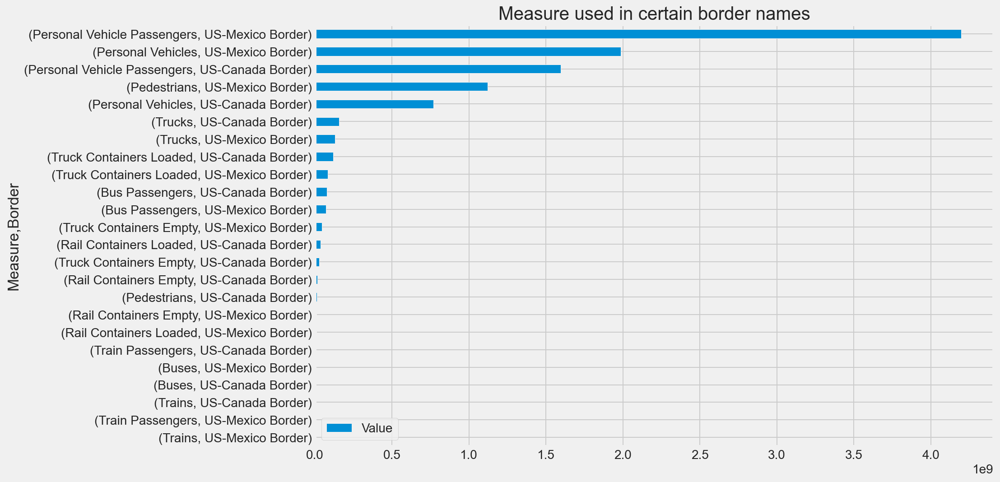

In [25]:
BC.groupby(["Measure", "Border"], sort=True)[["Value"]].sum().sort_values(by='Value',ascending=True).plot(kind='barh',figsize=(12,8))
plt.title("Measure used in certain border names")
plt.show()

Number of Personal Vehicle Passenger through US-Mexico by Value is essencially higher.

In [26]:
BC

,Port Name,State,Port Code,Border,Date,Measure,Value
0,Alcan,Alaska,3104,US-Canada Border,12/01/2021 12:00:00 AM,Personal Vehicle Passengers,822
1,Alcan,Alaska,3104,US-Canada Border,12/01/2021 12:00:00 AM,Personal Vehicles,468
2,Alcan,Alaska,3104,US-Canada Border,12/01/2021 12:00:00 AM,Truck Containers Empty,291
3,Alcan,Alaska,3104,US-Canada Border,12/01/2021 12:00:00 AM,Truck Containers Loaded,89
4,Alcan,Alaska,3104,US-Canada Border,12/01/2021 12:00:00 AM,Trucks,381
...,...,...,...,...,...,...,...
370866,Whitlash,Montana,3321,US-Canada Border,01/01/1996 12:00:00 AM,Bus Passengers,0
370867,Whitlash,Montana,3321,US-Canada Border,01/01/1996 12:00:00 AM,Personal Vehicles,63
370868,Whitlash,Montana,3321,US-Canada Border,01/01/1996 12:00:00 AM,Truck Containers Empty,0
370869,Whitlash,Montana,3321,US-Canada Border,01/01/1996 12:00:00 AM,Pedestrians,0


- Question 4

Is there any specific relation with the Value of border crossing with the Date?

In [27]:
#transforming data into convenient columns & variables 
#to be able to find the relation of the count& Date crosing border
BC['Date']=pd.to_datetime(BC['Date'])

In [28]:
#assining separately day,month,year to sepparate column 
BC['Day'] = BC['Date'].dt.day
BC['Month'] = BC['Date'].dt.month
BC['Year'] = BC['Date'].dt.year

In [29]:
BC.Year.value_counts()

2010    16200
2005    16128
2006    16128
2009    16056
2007    16056
2008    16056
2015    15984
2004    15984
2014    15840
2013    15840
2012    15840
2011    15840
2003    15588
1996    14832
1997    14832
2002    14832
2001    14832
2000    14832
1999    14832
1998    14832
2016    13754
2017     9717
2019     9583
2018     9534
2020     8477
2021     8432
Name: Year, dtype: int64

In [30]:
BC.head()

,Port Name,State,Port Code,Border,Date,Measure,Value,Day,Month,Year
0,Alcan,Alaska,3104,US-Canada Border,2021-12-01,Personal Vehicle Passengers,822,1,12,2021
1,Alcan,Alaska,3104,US-Canada Border,2021-12-01,Personal Vehicles,468,1,12,2021
2,Alcan,Alaska,3104,US-Canada Border,2021-12-01,Truck Containers Empty,291,1,12,2021
3,Alcan,Alaska,3104,US-Canada Border,2021-12-01,Truck Containers Loaded,89,1,12,2021
4,Alcan,Alaska,3104,US-Canada Border,2021-12-01,Trucks,381,1,12,2021


In [31]:
years = BC['Date'].map(lambda x : x.year).unique()
years

array([2021, 2020, 2019, 2018, 2017, 2016, 2015, 2014, 2013, 2012, 2011,
       2010, 2009, 2008, 2007, 2006, 2005, 2004, 2003, 2002, 2001, 2000,
       1999, 1998, 1997, 1996])

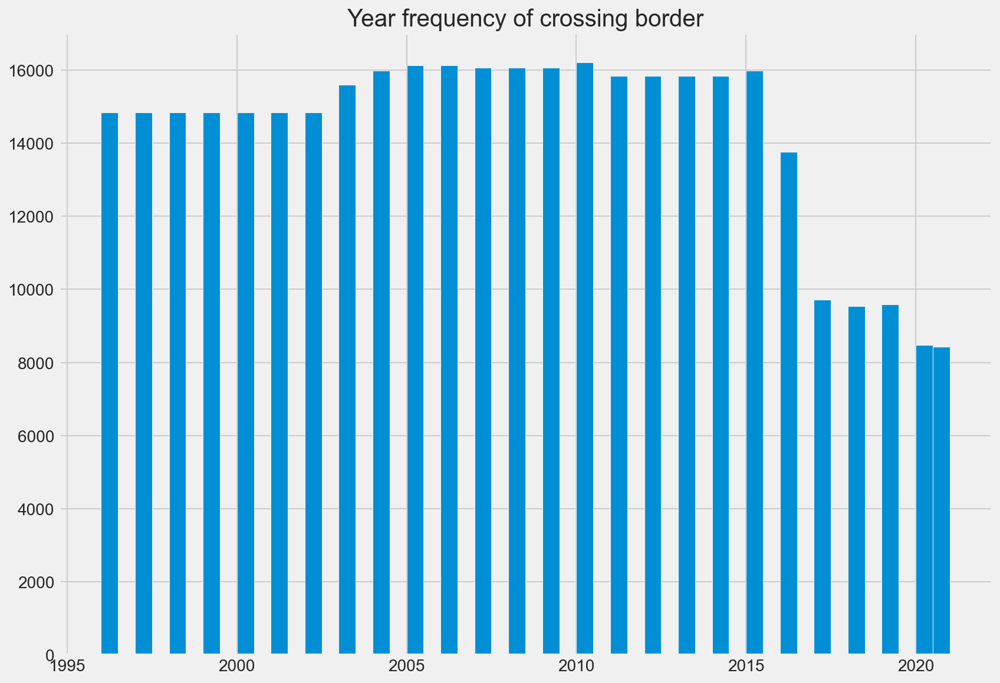

In [32]:
#by frequency 
BC.Year.hist(figsize=(12, 8),bins=50)
plt.tight_layout()
plt.title("Year frequency of crossing border")
plt.show()

The 1996-1998 years are the most frequent so far and the lowest frequensy is near 2019

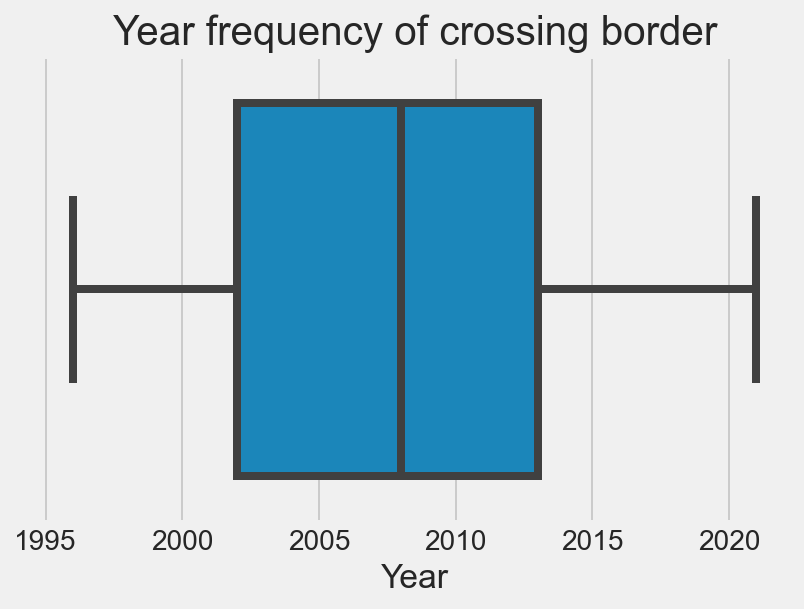

In [33]:
#displaying year on boxplot
sns.boxplot(BC.Year)
plt.title("Year frequency of crossing border")
plt.show()

The median is close to 2008 year ,45%- lower quartile,25% of the boxplot - upper quartile,lower whiskers-10% and upper whiskers-20%.

In [34]:
#calculating the # of Value per Year
calculate_crossing = BC.groupby("Year").sum()["Value"].reset_index()
calculate_crossing

,Year,Value
0,1996,429790351
1,1997,494174198
2,1998,508588404
3,1999,538456724
4,2000,540021542
5,2001,493083902
6,2002,475702818
7,2003,456392653
8,2004,458220298
9,2005,450234268


In [35]:
calculate_crossing.Value.max()

540021542

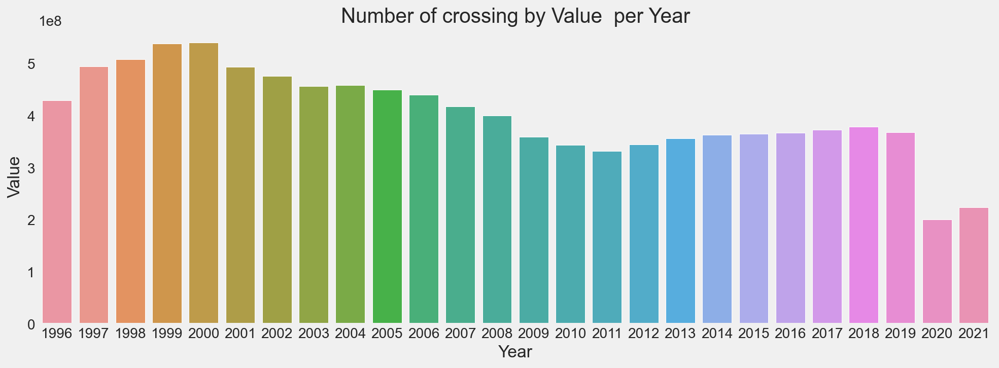

In [36]:
#Visualizing the Value per Year
plt.figure(figsize=(15,5))
plt.grid()
sns.set_style('dark')
chart = sns.barplot(x ='Year',y = 'Value',data=calculate_crossing);
chart.set_xticklabels(chart.get_xticklabels())
plt.title('Number of crossing by Value  per Year');

Very interesting fact that in 2000 year is the greatest Value=540021542 of border crossing,it's exactly a period of massive growth in the use and adoption of the Internet/and/stock market crash.
Another fact , 2020 is a year of Covid-19 shot down and it displays the lowest Value, which gives an impact on many different fields:population,comercial,industrial,economic,etc.
In a prediction of 2021, there is an improvement we can see in comparison with 2020.

In [37]:
calculate_crossing = BC.groupby("Month").sum()["Value"].reset_index()
calculate_crossing

,Month,Value
0,1,832449009
1,2,777444946
2,3,885596617
3,4,843300101
4,5,890985355
5,6,881915879
6,7,961755962
7,8,971582373
8,9,852678063
9,10,864118553


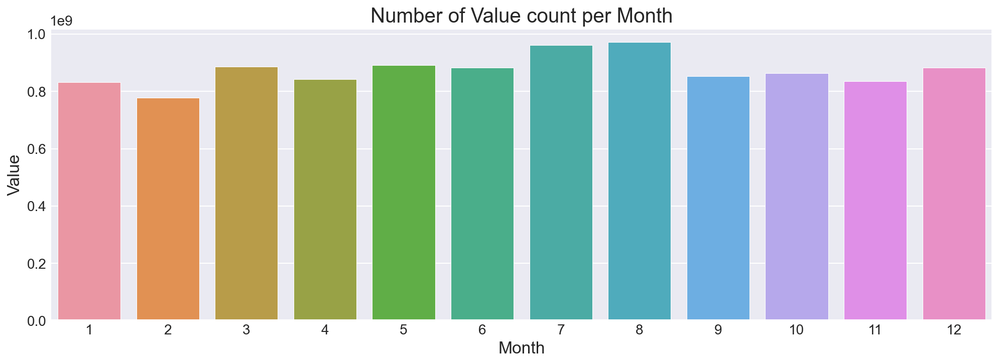

In [38]:
#Visualizing Value per Month
plt.figure(figsize=(15,5))
plt.grid()
sns.set_style('dark')
chart = sns.barplot(x ='Month',y ='Value',data=calculate_crossing);
chart.set_xticklabels(chart.get_xticklabels())
plt.title('Number of Value count per Month');


The most valuable months of July(7)& August(8),in fact right before the school season begins.
"Back to school", however there is no drastic difference in between the seasons.
August 2011 stock markets fall

In [39]:
#only 2 days are existing in this data .
BC.Day.unique()

array([1, 2])

In [40]:
calculate_day=BC.groupby('Day').sum()['Value'].reset_index()
calculate_day

,Day,Value
0,1,10480380083
1,2,97428


Text(0.5, 1.0, 'Value by number of days per Year')

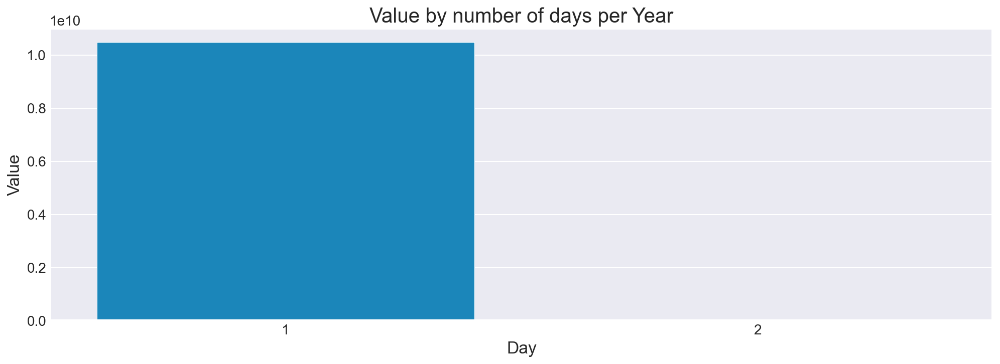

In [41]:
plt.figure(figsize=(15,5))
plt.grid()
sns.set_style('dark')
sns.barplot(x='Day',y='Value',data=calculate_day)
plt.title('Value by number of days per Year')


After analysing the data, the days appeared  as 1st day of the month and a few 2nd , therefore i'd consider the day column of the dataset as a permanent or continuous parameter. So, it's better to drop the value as a particular Scalar Quantity does not affect the result of a Linear Regression Model.
P.S.(scalar is a physical quantity that is completely described by its magnitude; examples of scalars are volume, density, speed, energy, mass, and time. Other quantities, such as force and velocity, have both magnitude and direction and are called vectors.)

In [42]:
# day column is not essential , dropping it
BC.drop(columns='Day',inplace=True)

In [43]:
BC.head()

,Port Name,State,Port Code,Border,Date,Measure,Value,Month,Year
0,Alcan,Alaska,3104,US-Canada Border,2021-12-01,Personal Vehicle Passengers,822,12,2021
1,Alcan,Alaska,3104,US-Canada Border,2021-12-01,Personal Vehicles,468,12,2021
2,Alcan,Alaska,3104,US-Canada Border,2021-12-01,Truck Containers Empty,291,12,2021
3,Alcan,Alaska,3104,US-Canada Border,2021-12-01,Truck Containers Loaded,89,12,2021
4,Alcan,Alaska,3104,US-Canada Border,2021-12-01,Trucks,381,12,2021


There is a categorical data (data that is bound to a specific values) while others are continuous values and can take any values over their interval.

The categorical values resembling real values can be directly applied to the model, but incase of object values, it cannot be directly sustain to prediction model. So, it is better to replace them with some dummy variables.

In [44]:
BC_DUM = pd.get_dummies(BC, columns=['Border', 'Measure','State'], drop_first=True)

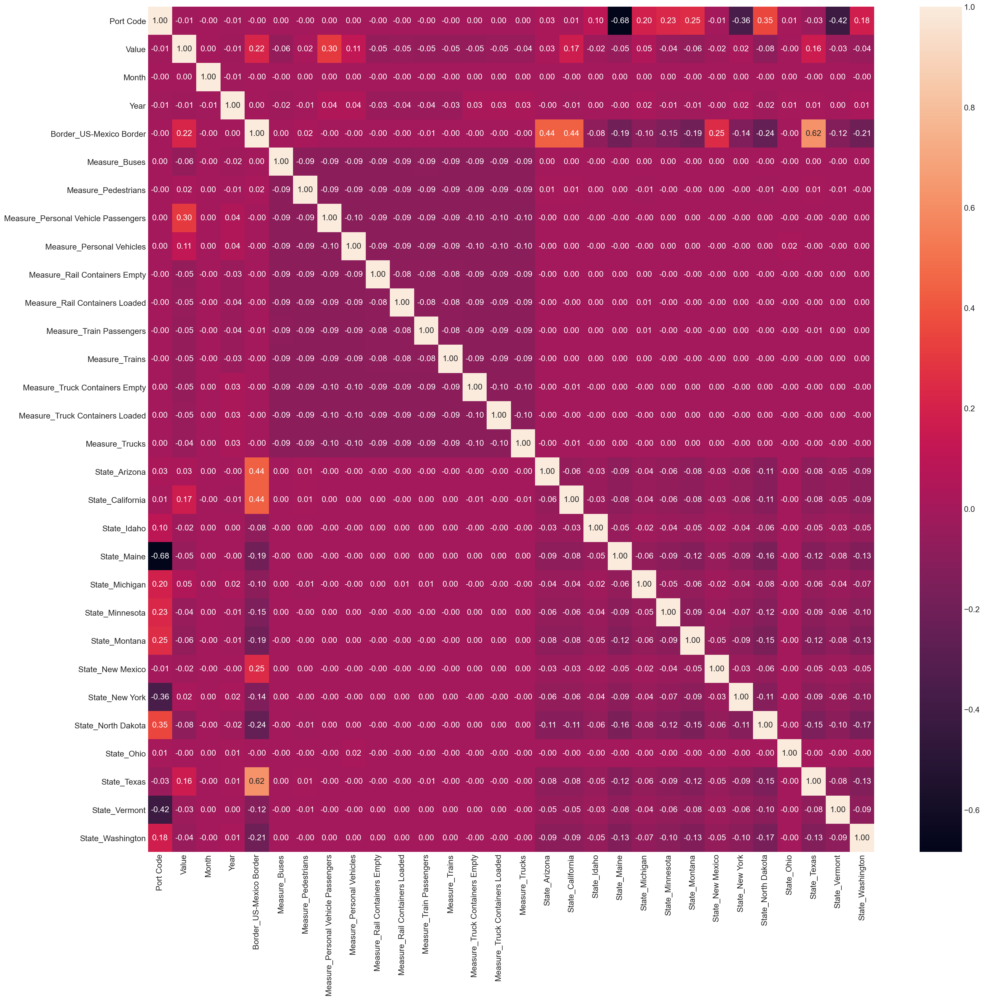

In [45]:
plt.figure(figsize=(25,25))
sns.heatmap(BC_DUM.corr(), annot=True, fmt=".2f");

The heatmap suggest a slightly strong correlation with US-Mexico_Border/State-TX , Measure Personal_vehicle_Passenger and  Value.

In [46]:
BC_DUM.columns

Index(['Port Name', 'Port Code', 'Date', 'Value', 'Month', 'Year',
       'Border_US-Mexico Border', 'Measure_Buses', 'Measure_Pedestrians',
       'Measure_Personal Vehicle Passengers', 'Measure_Personal Vehicles',
       'Measure_Rail Containers Empty', 'Measure_Rail Containers Loaded',
       'Measure_Train Passengers', 'Measure_Trains',
       'Measure_Truck Containers Empty', 'Measure_Truck Containers Loaded',
       'Measure_Trucks', 'State_Arizona', 'State_California', 'State_Idaho',
       'State_Maine', 'State_Michigan', 'State_Minnesota', 'State_Montana',
       'State_New Mexico', 'State_New York', 'State_North Dakota',
       'State_Ohio', 'State_Texas', 'State_Vermont', 'State_Washington'],
      dtype='object')

- Question 5

What is the number difference between passengers and transport?

In [47]:
passangers = BC[BC['Measure'].isin(['Personal Vehicle Passengers', 'Bus Passengers','Pedestrians', 'Train Passengers'])]
transport = BC[BC['Measure'].isin(['Trucks', 'Rail Containers Full','Truck Containers Empty', 'Rail Containers Empty',
                  'Personal Vehicles', 'Buses', 'Truck Containers Full'])]
passangers_borders = passangers[['Border','Value']].groupby('Border').sum()
transport_borders = transport[['Border','Value']].groupby('Border').sum()
values = passangers_borders.values.flatten()
labels = passangers_borders.index
t_values = transport_borders.values.flatten()
t_labels = transport_borders.index
fig = go.Figure(data = [go.Pie(labels = labels, values=values)])
fig.update(layout_title_text='Total inbound people, since 1996')
fig.show()

Per pie , 23.9% of people - US-Canada Border and the rest of 76.1%-US-Mexico Border by all tipe of Measures.

In [48]:
fig = go.Figure(data=[go.Pie(labels = t_labels, values=t_values)])
fig.update(layout_title_text='Total inbound trasport, since 1996')
fig.show()

Per pie 30.8% of all 12 type of transportation inbound US-Canada Border, 69.2%-US-Mexico Border.

In [49]:
#Canada & Mexico Borders by Value and Date using fig
p = passangers[['Date','Border','Value']].set_index('Date')
p = p.groupby([p.index.year, 'Border']).sum()

mexv = p.loc(axis=0)[:,'US-Mexico Border'].values.flatten().tolist()
canv = p.loc(axis=0)[:,'US-Canada Border'].values.flatten().tolist()
years = p.unstack(level=1).index.values

# Bar chart 
fig = go.Figure(go.Bar(x = years, y = mexv, name='US-Mexico Border'))
fig.add_trace(go.Bar(x = years, y = canv, name='US-Canada Border'))

fig.update_layout(title = 'Total inbound people by country borders and years', barmode='stack', 
                  xaxis={'categoryorder':'category ascending'})
fig.show()

Annual growth of inbound people by borders:US-Mexico/US-Canada.

# Part 3
## Time Series / Prediction.

- Visualizing Time Series Data of Entry


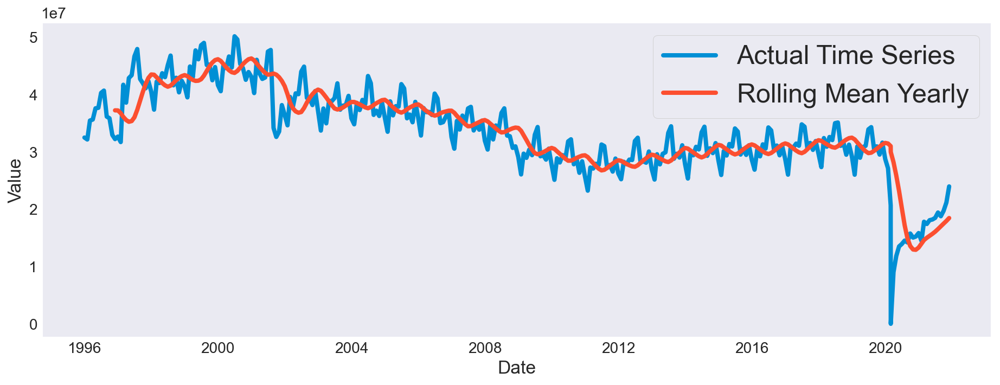

In [50]:
# Inspecting time series and rolling mean:

Dval = BC[['Date', 'Value']].groupby('Date').sum()
times = BC.groupby(['Date'])['Value'].agg(
    ['sum']).reset_index().rename(columns={'sum': 'Value'})

times = times.set_index('Date')


plt.figure(figsize=(14, 5))

sns.lineplot(x=times.index, y='Value',
                 data=times, label="Actual Time Series")

rmean = Dval.rolling(12, win_type='triang').mean()

sns.lineplot(x=rmean.index, y='Value',
                 data=rmean, label="Rolling Mean Yearly")

plt.legend(fontsize='xx-large')
plt.show()

As it displayed on the plot below mid2001 - 2012 are in a downward trend at the time of 9/11 attacks/financial crisis of 2007-2008, and slightly stable and even slightly increases up until 2019 right to the beginning of the Pandemic, 2020 is the Covid-19 shutdown then it tends to sharp decline. 

Inspecting vizually the data, I can observe a sort of seasonality by several sharp declines:
- Between 1997-1998. The only event I can remember is the 1997 World Junior Ice Hockey Championships were held in Geneva and Morges, Switzerland, The 1998 USA Men's World Championship Team in Athens,Greece,but it might not be the case.
- Between 2001-2002 it's  due to September 11 attacks.
- Then in 2002 it is a seasonal increase due to winter Olympic Games in Salt Lake City,Utah.
- Between 2007-2008 related to finance crisis.

In [51]:
#displaying out a new df- times
times

,Value
Date,
1996-01-01,32550342
1996-02-01,32212625
1996-03-01,35509073
1996-04-01,35690321
1996-05-01,37644486
...,...
2021-08-01,19484410
2021-09-01,18839570
2021-10-01,19766783


- Will be decomposing the Time Series further 

<Figure size 1152x576 with 0 Axes>

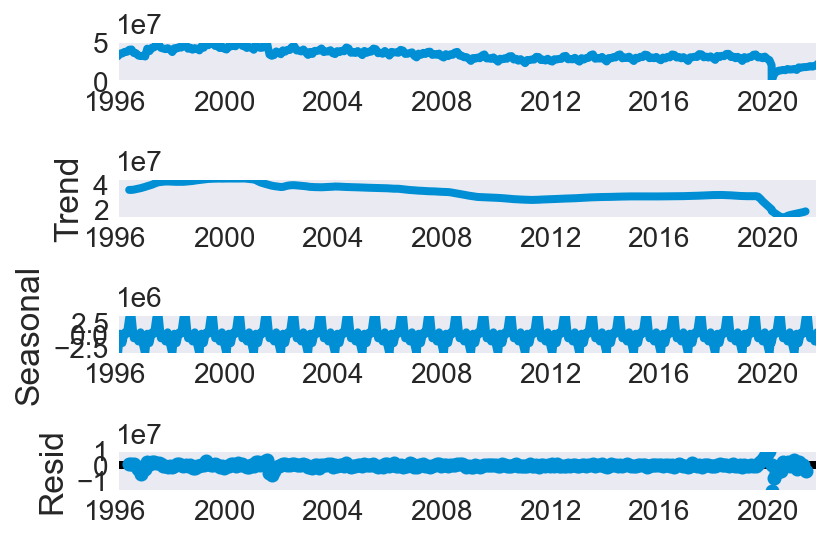

In [52]:
plt.figure(figsize=(16,8))
decompose_data = seasonal_decompose(times, model="additive",period=12)
decompose_data.plot();

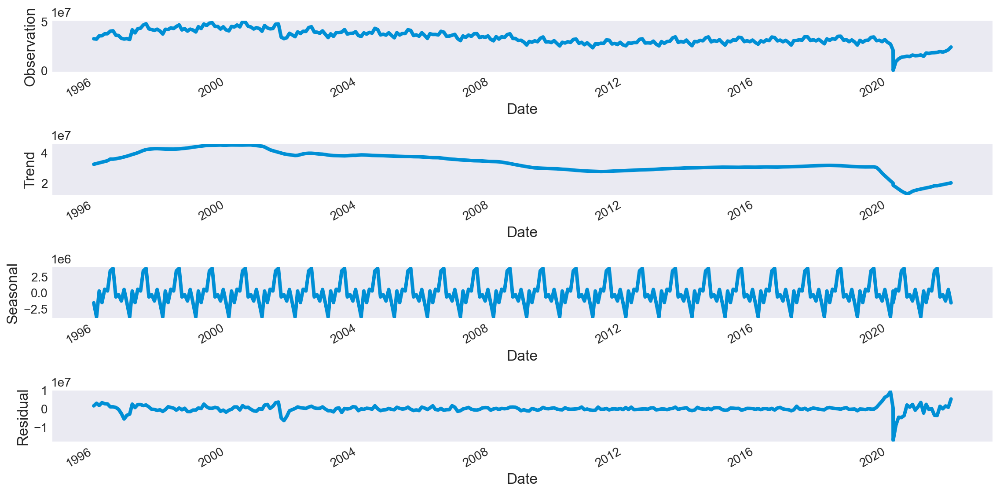

In [53]:
# Decomposing the data on  plot

decompose_data = sm.tsa.seasonal_decompose(
    times, model='additive', extrapolate_trend='freq',period=12)

# Plotting
fig, axes = plt.subplots(nrows=4, figsize=(16, 8))

decompose_data.observed.plot(ax=axes[0], legend=False)#legent displays sticky/better not display
axes[0].set_ylabel('Observation')

decompose_data.trend.plot(ax=axes[1], legend=False)#plotting the trend line
axes[1].set_ylabel('Trend')

decompose_data.seasonal.plot(ax=axes[2], legend=False)
axes[2].set_ylabel('Seasonal')

decompose_data.resid.plot(ax=axes[3], legend=False)
axes[3].set_ylabel('Residual')
#displaying the difference between results obtained by observation 
#and by computation from a formula or between the mean of several 
#observations and any one of them, defining  residuals.

plt.tight_layout()
plt.show()

Y axis explanation:

Observed-Normal  plot

Trend- Shows the crossing data responsible for the trend and its moving direction.

Seasonal-Its the repeating patterns in the data with trend.

Residual-Rest of the remaining data after removing trend and seasonal components.March 2020 is a big decrease.

Seasonality is clearly observed. It's highly related to holidays,tourism,weather condition,etc. It is clearly displayed how the mid summer season arises and a slightly jump up before Christmas and finally there is a sharp decline right after New Years.

## SARIMAX Forcasting

Would like to use Forecasting With SARIMAX
Now I need to find the best parameters for the model to deliver optimal results.Since the model for this data-set is SARIMA(p,d,q)(P,D,Q)I need to find the best order value for SARIMA (p,d,q) and its Seasonal order values (P,D,Q)
An extension to ARIMA that supports the direct modeling of the seasonal component of the series is called SARIMA.
Applying one of the most common forecasting methods: ARIMA(Autoregressive Integrated Moving Average)

In [54]:
#  Training data:

train = times.loc['2011':'2021']


In [55]:
#Defining seasonality, trend, and noise combinations.

p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))

seasonal_pdq = [(x[0], x[1], x[2], 12)
                for x in list(itertools.product(p, d, q))]

print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

Examples of parameter combinations for Seasonal ARIMA...
SARIMAX: (0, 0, 1) x (0, 0, 1, 12)
SARIMAX: (0, 0, 1) x (0, 1, 0, 12)
SARIMAX: (0, 1, 0) x (0, 1, 1, 12)
SARIMAX: (0, 1, 0) x (1, 0, 0, 12)


In [56]:
#Searching for paramaters
   # Disabled for better looking

for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(train,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            results = mod.fit()
            print('ARIMA{}x{}12 - AIC:{}'.format(param,
                                                 param_seasonal, results.aic))
        except:
            continue


ARIMA(0, 0, 0)x(0, 0, 0, 12)12 - AIC:4906.427352209286
ARIMA(0, 0, 0)x(0, 0, 1, 12)12 - AIC:4384.1904016433455
ARIMA(0, 0, 0)x(0, 1, 0, 12)12 - AIC:4098.560727639446
ARIMA(0, 0, 0)x(0, 1, 1, 12)12 - AIC:3698.457347432436
ARIMA(0, 0, 0)x(1, 0, 0, 12)12 - AIC:4126.96271486521
ARIMA(0, 0, 0)x(1, 0, 1, 12)12 - AIC:4096.639800849671
ARIMA(0, 0, 0)x(1, 1, 0, 12)12 - AIC:3725.6929429042557
ARIMA(0, 0, 0)x(1, 1, 1, 12)12 - AIC:3697.047528844743
ARIMA(0, 0, 1)x(0, 0, 0, 12)12 - AIC:4777.546820102498
ARIMA(0, 0, 1)x(0, 0, 1, 12)12 - AIC:4321.21500518358
ARIMA(0, 0, 1)x(0, 1, 0, 12)12 - AIC:3992.685333591987
ARIMA(0, 0, 1)x(0, 1, 1, 12)12 - AIC:3588.852373485106
ARIMA(0, 0, 1)x(1, 0, 0, 12)12 - AIC:4383.514472337426
ARIMA(0, 0, 1)x(1, 0, 1, 12)12 - AIC:4312.885901278945
ARIMA(0, 0, 1)x(1, 1, 0, 12)12 - AIC:3654.1183493630588
ARIMA(0, 0, 1)x(1, 1, 1, 12)12 - AIC:3588.622740430908
ARIMA(0, 1, 0)x(0, 0, 0, 12)12 - AIC:4285.328319756343
ARIMA(0, 1, 0)x(0, 0, 1, 12)12 - AIC:3886.6149904262575
ARIMA(0,

### Validating Model
The model looks decent, will continue with validating the forecast.



In [57]:
# Fitting the model to see how accurate the outcome will be .

mod = sm.tsa.statespace.SARIMAX(train,
                                order=(1, 1, 1),
                                seasonal_order=(1, 1, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)

results = mod.fit()

print(results.summary().tables[1])

                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7756      0.414      1.874      0.061      -0.036       1.587
ma.L1         -0.8424      0.397     -2.122      0.034      -1.620      -0.064
ar.S.L12      -0.9893      0.405     -2.440      0.015      -1.784      -0.195
ma.S.L12       0.0810      0.392      0.207      0.836      -0.687       0.849
sigma2      1.152e+13   2.21e-13    5.2e+25      0.000    1.15e+13    1.15e+13


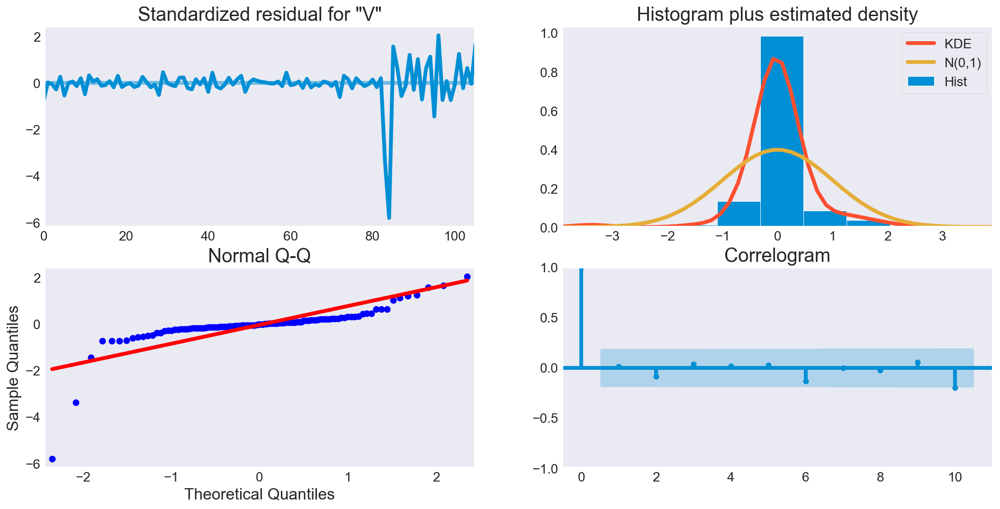

In [58]:
# Investigating the results:
#KDE-kernal density estimator
results.plot_diagnostics(figsize=(16, 8))
plt.show()

There si a slight alignment with the observed value in the forcast and only the few past years are better aligned.
The histogram looks pretty much normally destributed with a very little skewness to the left.

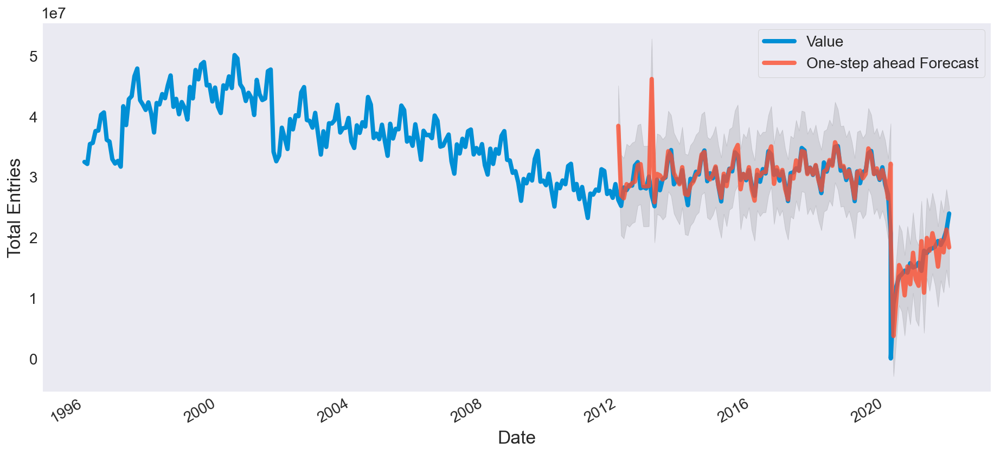

In [59]:
# predicting the value increase for 2023

prediction = results.get_prediction(
    start=pd.to_datetime('2012-01-01'), dynamic=False)

pred_ci = prediction.conf_int()

ax = times['1996':].plot(label='observed')

prediction.predicted_mean.plot(
    ax=ax, label='One-step ahead Forecast', alpha=.8, figsize=(14, 7))

ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.1)

ax.set_xlabel('Date')
ax.set_ylabel('Total Entries')

plt.legend()
plt.show()

-  Overview

The model embraced the seasonality just fine with the increasing trend for the period of 2021-2023. The model confidence interval swiftly grows within two years and therefore is getting less confident , anyways it is fairly fine.But let's investigate it further. Is this behaviour the same in both borders?


In [60]:
import calendar

In [61]:
people_crossing_series = BC[['Date','Value']].groupby('Date').sum()
people_crossing_series_CAN = BC[BC['Border'] == 'US-Canada Border'][['Date','Value']].groupby('Date').sum()
people_crossing_series_MEX = BC[BC['Border'] == 'US-Mexico Border'][['Date','Value']].groupby('Date').sum()


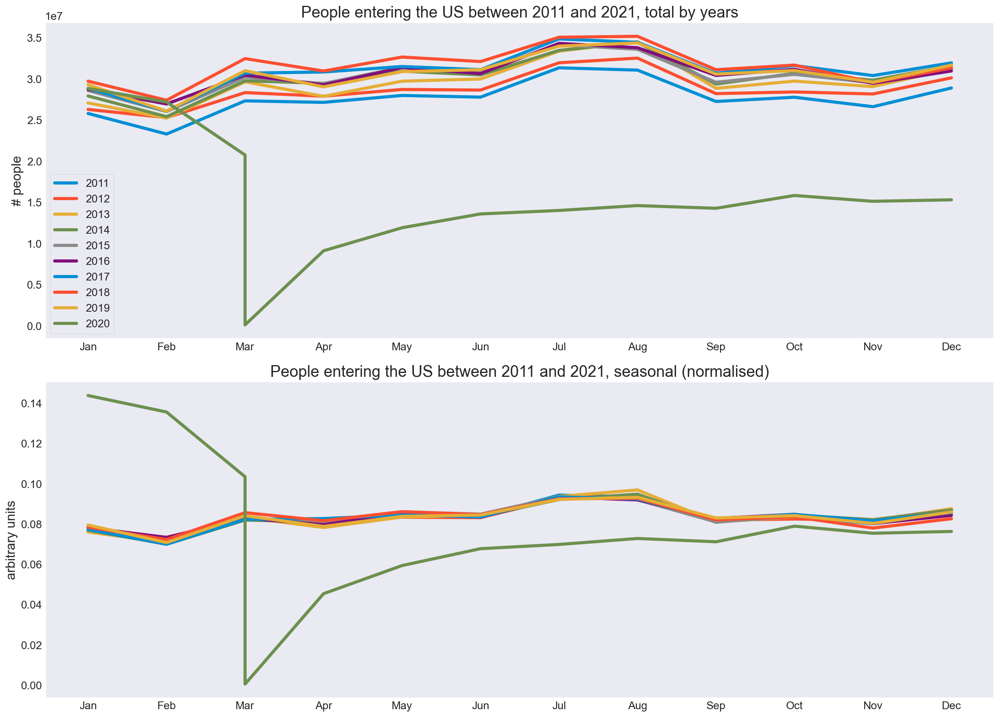

In [62]:
#Taking 10 years into consideration
start = '2011'
end = '2021'
pcsm = people_crossing_series.loc[start:end]
months = [calendar.month_abbr[m] for m in range(1,13)]
fig, ax = plt.subplots(2,figsize = (18,13))

start = int(start)
end = int(end)

for i in range(start, end) :
    yy = pcsm[pcsm.index.year == i];
    yy = yy.set_index(yy.index.month);
    ax[0].plot(yy
               , label = i)
    ax[1].plot(yy/yy.sum()
               , label = i)
    
ax[0].set(title = 'People entering the US between {} and {}, total by years'.format(start, end),
         ylabel = '# people')

ax[1].set(title = 'People entering the US between {} and {}, seasonal (normalised)'.format(start, end),
         ylabel = 'arbitrary units')

plt.setp(ax, xticks = range(1,13), xticklabels = months)
ax[0].legend()
plt.tight_layout()

plt.show()

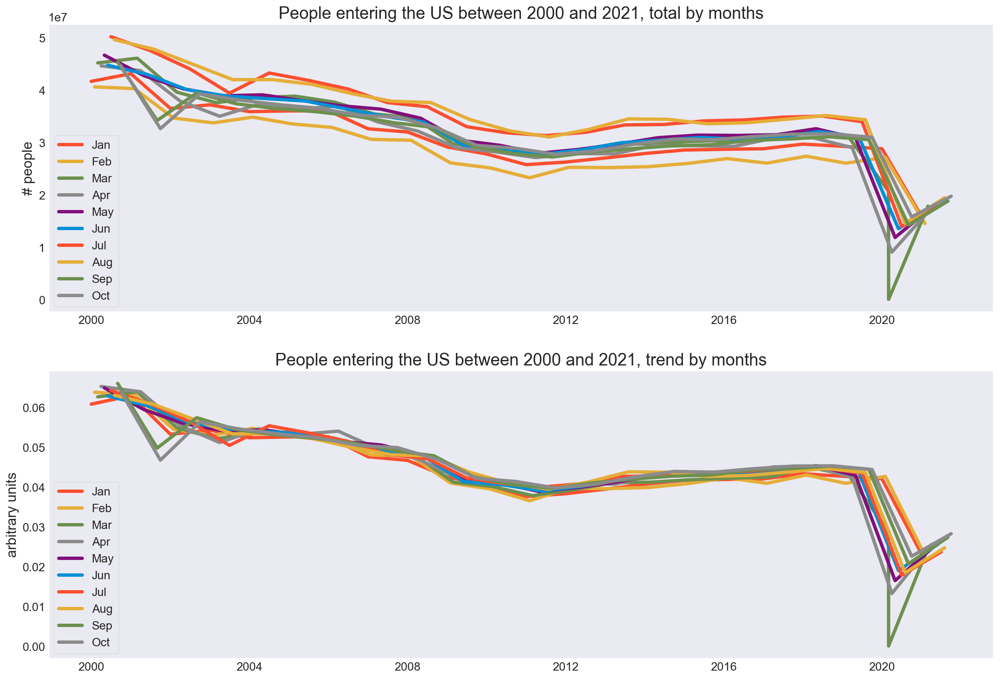

In [63]:
start = '2000'
end = '2021'
pcsm = people_crossing_series.loc[start:end]

fig, ax = plt.subplots(2,figsize = (18,13))

for i in range(11) :
    mm = pcsm[pcsm.index.month == i] 
    ax[0].plot(mm, label = calendar.month_abbr[i])
    ax[1].plot(mm/mm.sum(), label = calendar.month_abbr[i])
    
ax[0].set(title = 'People entering the US between {} and {}, total by months'.format(start, end),
         ylabel = '# people')
ax[1].set(title = 'People entering the US between {} and {}, trend by months'.format(start, end),
         ylabel = 'arbitrary units')
ax[0].legend()
ax[1].legend()

plt.show()


Covid-19 is a fair explanation for the drastik and sharp tend down in March 2020

The monthly forecast displays a slump in September&October at the end of 2002 and a way more noticeable slump on March of 2020. For the period of 2007-2008 during the financial crisis trend slids down and it's stabilizes up until end of 2019.

- Exploring timeseries for both US-Mexico & US_Canada borders.

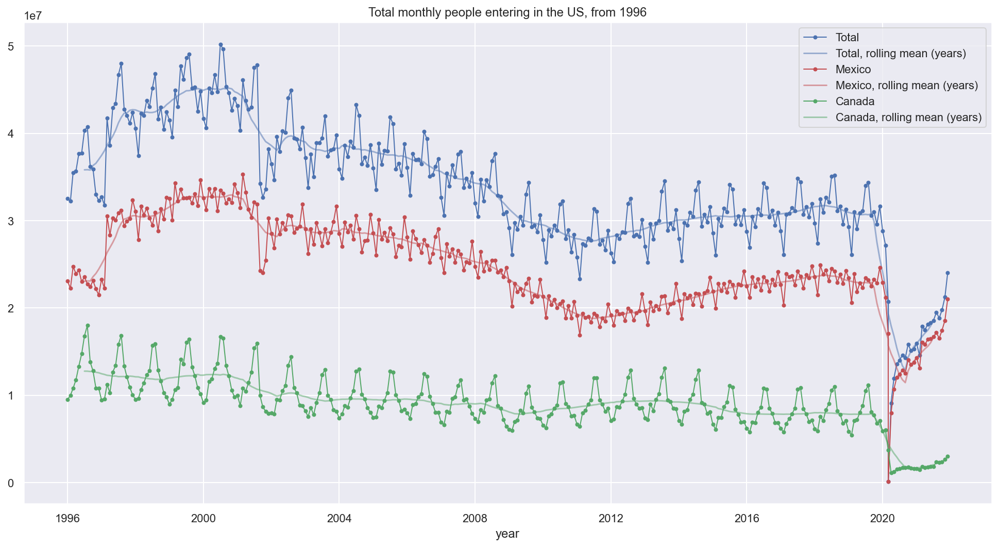

In [64]:
sns.set(rc={'figure.figsize':(15, 8)})
fig, ax = plt.subplots()

#Define a rolling mean, by years
rmean = people_crossing_series.rolling(12, center=True).mean()
rmean_MEX = people_crossing_series_MEX.rolling(12, center=True).mean()
rmean_CAN = people_crossing_series_CAN.rolling(12, center=True).mean()

ax.plot(people_crossing_series,
       marker='.', linestyle='-', linewidth=1, alpha = 1, label='Total')
ax.plot(rmean,
       marker=None, linestyle='-', linewidth=1.5, alpha = 0.5, label='Total, rolling mean (years)', color = 'b')

ax.plot(people_crossing_series_MEX,
       marker='.', linestyle='-', linewidth=1, alpha = 1, label='Mexico', color = 'r')
ax.plot(rmean_MEX,
       marker=None, linestyle='-', linewidth=1.5, alpha = 0.5, label='Mexico, rolling mean (years)', color = 'r')

ax.plot(people_crossing_series_CAN,
       marker='.', linestyle='-', linewidth=1, alpha = 1, label='Canada', color = 'g')
ax.plot(rmean_CAN,
       marker=None, linestyle='-', linewidth=1.5, alpha = 0.5, label='Canada, rolling mean (years)', color = 'g')

ax.set(title = 'Total monthly people entering in the US, from 1996', xlabel = 'year')
ax.legend()

plt.show()


There is definitely Pandemic impact at the beginning of Spring of  2020 on  US-Mexican border...
Will be focusing on a shorter period to analize

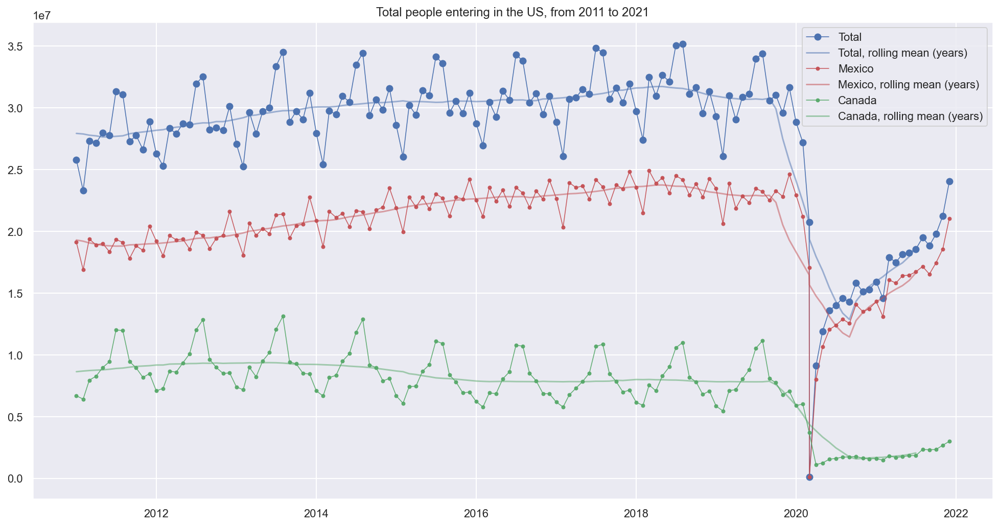

In [65]:
fig, ax = plt.subplots()

start = '2011'
end = '2021'


ax.plot(people_crossing_series.loc[start:end],
       marker='o', linestyle='-', linewidth=0.8, alpha = 1, label='Total', color = 'b')
ax.plot(rmean.loc[start:end],
       marker=None, linestyle='-', linewidth=1.5, alpha = 0.5, label='Total, rolling mean (years)', color = 'b')

ax.plot(people_crossing_series_MEX.loc[start:end],
       marker='.', linestyle='-', linewidth=0.8, alpha = 0.9, label='Mexico', color = 'r')
ax.plot(rmean_MEX.loc[start:end],
       marker=None, linestyle='-', linewidth=1.5, alpha = 0.5, label='Mexico, rolling mean (years)', color = 'r')

ax.plot(people_crossing_series_CAN.loc[start:end],
       marker='.', linestyle='-', linewidth=0.8, alpha = 0.9, label='Canada',color = 'g')
ax.plot(rmean_CAN.loc[start:end],
       marker=None, linestyle='-', linewidth=1.5, alpha = 0.5, label='Canada, rolling mean (years)', color = 'g')

ax.set(title = 'Total people entering in the US, from {} to {}'.format(start, end))
ax.legend()

plt.show()


There's seasonal component, with a period of one year between 2020-2021.It's minimums are during the spring,specialy in March, in the mean time the maximums are in summer, during July & August.The drastik tend to drop in March of 2020 is explained by Covid-19 shutdown. 

In [66]:

from matplotlib.gridspec import GridSpec

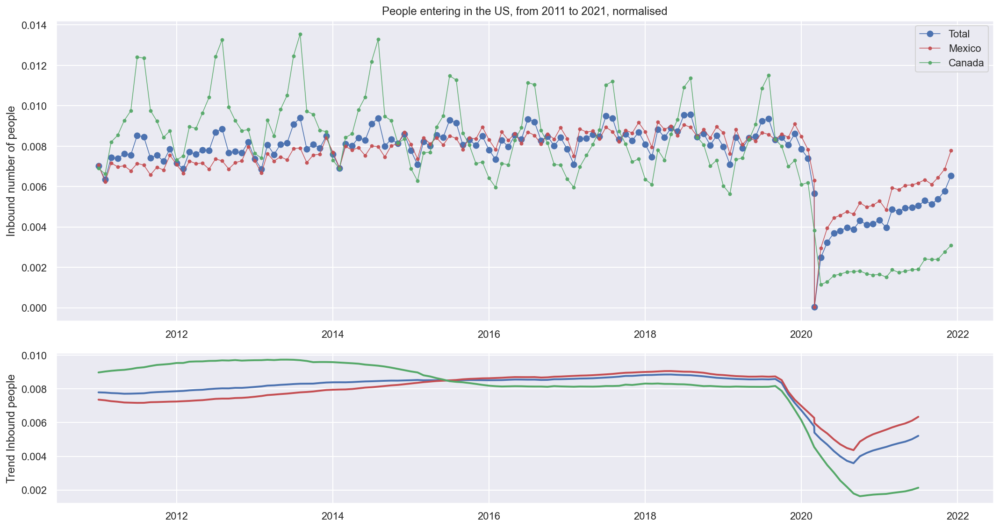

In [67]:
#Displaying seasonal trend of inbound people to US for the period of 2011-2021 from Mex&Can, using plot/GridSpec
fig = plt.figure()

grid = plt.GridSpec(nrows=2, ncols=1, height_ratios=[2, 1])

seas = fig.add_subplot(grid[0])
trend = fig.add_subplot(grid[1], sharex = seas)

start = '2011'
end = '2021'

seas.plot(people_crossing_series.loc[start:end]/people_crossing_series.loc[start:end].sum(),
       marker='o', linestyle='-', linewidth=0.8, alpha = 1, label='Total', color = 'b')

seas.plot(people_crossing_series_MEX.loc[start:end]/people_crossing_series_MEX.loc[start:end].sum(),
       marker='.', linestyle='-', linewidth=0.8, alpha = 0.9, label='Mexico', color = 'r')

seas.plot(people_crossing_series_CAN.loc[start:end]/people_crossing_series_CAN.loc[start:end].sum(),
       marker='.', linestyle='-', linewidth=0.8, alpha = 0.9, label='Canada', color = 'g')

seas.set(title = 'People entering in the US, from {} to {}, normalised'.format(start, end),
      ylabel = 'Inbound number of people')
seas.legend()

trend.plot(rmean.loc[start:end]/rmean.loc[start:end].sum(),
       marker='', linestyle='-', linewidth=2, alpha = 1, label='Total', color = 'b')

trend.plot(rmean_MEX.loc[start:end]/rmean_MEX.loc[start:end].sum(),
       marker='', linestyle='-', linewidth=2, alpha = 1, label='Mexico', color = 'r')

trend.plot(rmean_CAN.loc[start:end]/rmean_CAN.loc[start:end].sum(),
       marker='', linestyle='-', linewidth=2, alpha = 1, label='Canada', color = 'g')

trend.set(ylabel = 'Trend Inbound people')
fig.tight_layout()
plt.show()

In a prediction of 2022 there is an increase of the inbound number of people from both Mexico and Canada countries, it is definately deliverying a good impact to economy and growing number of population in general after a very big distract of Covid-19 shutdown.

# Summary

I'm still a beginner and want to improve myself in every way I can.
